In [41]:
# %matplotlib ipympl
# %matplotlib notebook
# %matplotlib qt
import pandas
import pathlib
import re
import numpy as np
# import plotly.graph_objects as go
import datetime
import matplotlib.pyplot as plt
from matplotlib import animation
import json
from typing import Tuple

cwd = pathlib.Path.cwd()

G = 6.67408e-11
YEARS = 1
SCALE = 100
SECONDS = 60*60*24/SCALE  # number of seconds in a day
yseconds = 365*SECONDS*SCALE  # number of seconds in a year
X = RN = 0  # I prefer doing this rather then using the numerical index
Y = VN = 1  # now I can plug these in and remind myself what this physically represents rather then remember which index I'm calling
dt = SECONDS
print(SECONDS)
print(yseconds)

864.0
31536000.0


In [42]:
def import_bodies() -> tuple:
    '''
    Reads the AstronomicalObjects.json and puts it in a vector.
    '''
    with open(cwd / "AstronomicalObjects.json", 'r') as json_file:
        json_data = json.load(json_file)
        system_data = json_data["System"]

        body_names = []
        mass = np.zeros((len(system_data), 1))
        rn = np.zeros((len(system_data), 1, 2))
        vn = np.zeros((len(system_data), 1, 2))

        for i, obj in enumerate(system_data.values()):
            body_names.append(obj["name"])
            mass[i] = obj["m"]
            
            rn[i][0][X] = obj["x0"]
            rn[i][0][Y] = obj["y0"]

            vn[i][0][X] = obj["vx0"]
            vn[i][0][Y] = obj["vy0"]

        return tuple(body_names), mass, rn, vn

        #     system.append(body)

        # return tuple(system)

In [43]:
def acc(rn: np.array, gm: np.array) -> np.array:
    '''
    rn is a Nx2 vector, and gm is a Nx1 vector. Note: gm should be mass * G * (-1)
    Yields the dv/dt = k value

    dv/dt = -G Sum[ Mj * (ri + (dri*h) - rj)/(ri + (dri*h) - rj)**3]
    '''

    an = np.zeros(shape = (rn.shape[0], 2))

    for i, ri in enumerate(rn):

        for j, rj in enumerate(rn):
            if j != i:

                r = np.sqrt(np.dot(ri - rj, ri - rj))

                a = gm[j] / r**3

                an[i] += a * (ri - rj)

    # print(an)
    # print(an.shape)

    return an


def euc_dist(x: np.array):
    return np.sqrt(np.dot(x, x))


def RK4(mass: np.array, rn: np.array, vn: np.array, h: float):
    '''
    Takes an Nx2 matrix for position & velocity, and Nx1 matrix for mass
    '''
    dr1 = h*vn
    dv1 = h*acc(rn, mass)

    dr2 = h*(vn + dv1*h/2)
    dv2 = h*acc(rn + (dr1*h/2), mass)
    
    dr3 = h*(vn + dv2*h/2)
    dv3 = h*acc(rn + (dr2*h/2), mass)

    dr4 = h*(vn + dv3*h)
    dv4 = h*acc(rn + (dr3*h), mass)

    return (rn + (1/6)*(dr1 + 2*dr2 + 2*dr3 + dr4)), (vn + (1/6)*(dv1 + 2*dv2 + 2*dv3 + dv4))


def orbits(time_steps: int, 
           body_names: tuple, 
           mass: np.array, 
           rn_data: np.array, 
           vn_data: np.array, 
           h: float, 
           delta = 1.0e1):
    '''
    '''
    rn = rn_data[:, 0, :]
    vn = vn_data[:, 0, :]

    n_bodies = len(body_names)
    sun_index = body_names.index("Sun")
    sun_array = np.zeros((2,))

    
    t = 0
    while t < time_steps:

        rho = 0
        safty = 0
        while rho < 1:
            dt = 2*h
            
            rn1, vn1 = RK4(mass, rn, vn, h)
            rn1[sun_index, :] = sun_array
            vn1[sun_index, :] = sun_array
            rn1, vn1 = RK4(mass, rn1, vn1, h)
            rn1[sun_index, :] = sun_array
            vn1[sun_index, :] = sun_array

            rn2, vn2 = RK4(mass, rn, vn, 2*h)
            rn2[sun_index, :] = sun_array
            vn2[sun_index, :] = sun_array

            diff = np.apply_along_axis(euc_dist, 1, rn1 - rn2)

            rho_mat = 1 * h * delta * np.ones_like(diff)
            rho_mat = np.divide(rho_mat, diff, out = (2**4) * np.ones_like(rho_mat), where = diff != 0)

            rho = np.min(rho_mat)
            h = min(h * rho**(1/4), 2*h)
            if safty > 100:
                print("Iterated into oblivion")
                raise
            safty += 1

        rn, vn = rn1, vn1

        rn_data = np.concatenate([rn_data, np.reshape(rn, (n_bodies, 1, 2))], axis = 1)
        vn_data = np.concatenate([vn_data, np.reshape(vn, (n_bodies, 1, 2))], axis = 1)
        t += dt

        print(t)
    
    return rn_data


In [44]:
body_names, mass, rn, vn = import_bodies()

mass = (-1) * G * mass

rn = orbits(yseconds, body_names, mass, rn, vn, dt)
# print(rn.shape)

# print(rn[1])

# print(rn[1])
# print(rn[1, :, X])


48.51311842509474
97.02623591771325
145.5393534286838
194.05247129649356
242.56558922912507
291.0787054078377
339.5918209337612
388.1049373859725
436.6180537891624
485.1311696645904
533.6442864652016
582.1574031393504
630.670519525547
679.1836354670202
727.696752217375
776.2098686325053
824.7229847868643
873.2361016925877
921.7492185067827
970.2623349869734
1018.7754515022973
1067.2885686967363
1115.8016854296313
1164.3148020445371
1212.8279192304565
1261.3410363444432
1309.8541532380732
1358.3672696770495
1406.880385292898
1455.393500987136
1503.9066167276094
1552.4197324730653
1600.932849696757
1649.4459650543831
1697.9590816823645
1746.4721975338994
1794.9853146641046
1843.498429950819
1892.0115462555966
1940.524661256012
1989.0377770792745
2037.5508924040116
2086.064008504795
2134.5771244710318
2183.090239918223
2231.6033551363234
2280.11647083533
2328.6295870656986
2377.1427030333857
2425.6558184278215
2474.168934061807
2522.682049921219
2571.1951659873453
2619.708282235734
2668.2

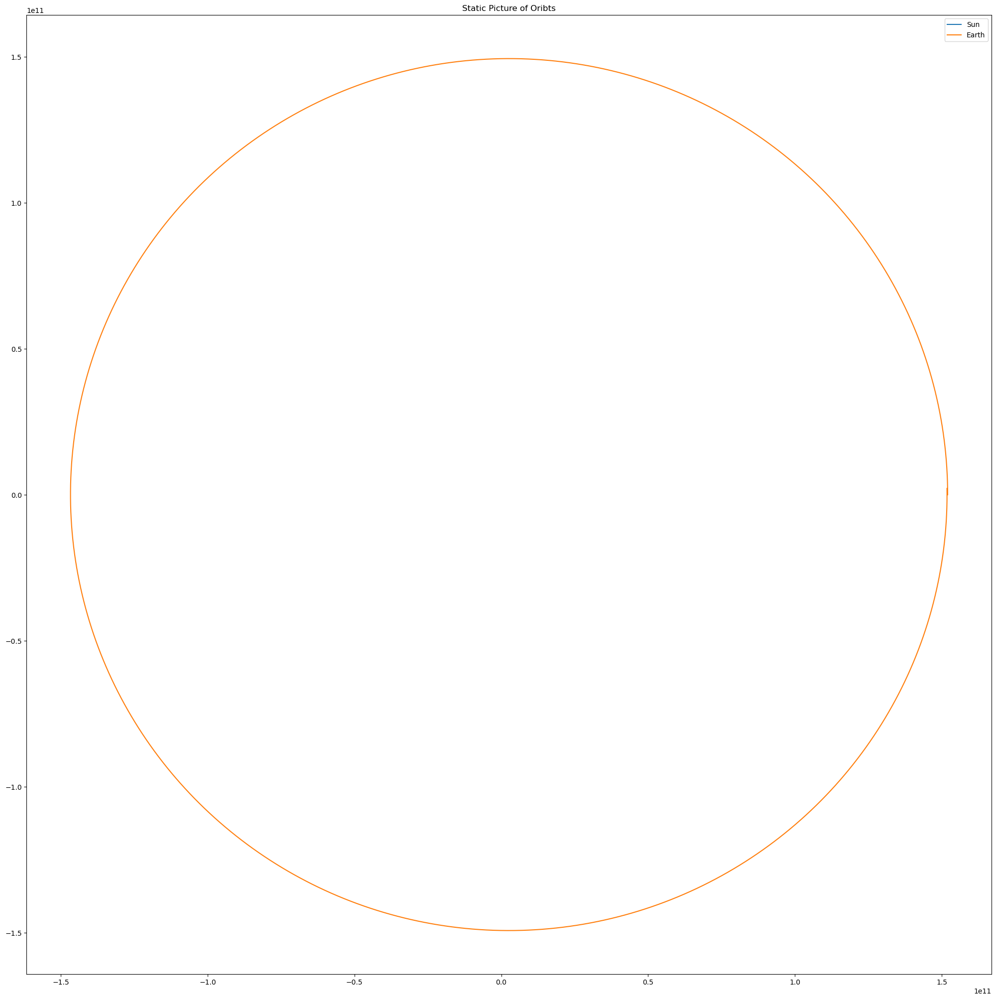

In [46]:
plt.figure(figsize = (25, 25))

n_bodies = len(mass)

for body in range(n_bodies):
    x_data = rn[body, :, X]
    y_data = rn[body, :, Y]
    plt.plot(x_data, y_data, label = body_names[body])

plt.legend()
plt.title("Static Picture of Oribts")
plt.savefig(str(cwd / f"Static_Orbits_for_{YEARS}_years.png"))
plt.show()